In [0]:
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt

import sqlite3
import pandas as pd
import numpy as np
import seaborn as sns
import nltk
from tqdm import tqdm
from bs4 import BeautifulSoup
import re
import datetime
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
from nltk.stem import SnowballStemmer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from gensim.models import Word2Vec
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from wordcloud import WordCloud, STOPWORDS
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

In [10]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

     |████████████████████████████████| 993kB 4.6MB/s 


In [0]:
link ="https://drive.google.com/open?id=18yHOyLnrSgzAabvXoev4C2yjzSThegLB"
fluff, id = link.split('=')
downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('database.sqlite')

In [12]:
# Load the data from .sqlite file

db=sqlite3.connect('database.sqlite')

# select all reviews from given dataset
# we are considering a review is positive or negative on the basis of the Score column which is nothing but a rating given
# by a customer for a product. If a score >3 it is considered as positive elseif score<3 it is negative and score=3 is neutral
# Therefore all reviews which are having score other than 3 are taken into account.

filtered_data=pd.read_sql_query("""
SELECT *
FROM Reviews WHERE Score!=3""",db)

# Replace this numbers in Score column as per our assumptions i.e replace 3+ with positive 1 and 3- with negative 0
def partition(x):
    if x < 3:
        return -1
    return 1

# changing reviews with score less than 3 to be positive (1) and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print(filtered_data.shape)


(525814, 10)


In [0]:
# converting datestamp into string representable form as YYYY-MM-DD
filtered_data["Time"] = filtered_data["Time"].map(lambda t: datetime.datetime.fromtimestamp(t).strftime('%Y-%m-%d'))

In [14]:
# There is lot of duplicate data present as we can see above productId B007OSBE1U 
# have multiple duplicate reviews this is what we need to avoid.

# so first step is to sort the data and then remove duplicate entries so that only
# one copy of them should be remain in our data.
dup_free=filtered_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"})
# dup_free.head()
# This is shape of our dataset of 100k datapoints after removal of dups
dup_free.shape

(364173, 10)

In [0]:
final_filtered_data=dup_free[dup_free.HelpfulnessNumerator<=dup_free.HelpfulnessDenominator]

In [16]:
final_filtered_data.shape

(364171, 10)

In [17]:
((final_filtered_data['Id'].size*1.0)/(filtered_data['Id'].size*(1.0)))*100

69.25852107399194

In [0]:
filtered_data=filtered_data.sort_values(by='Time').reset_index(drop=True)

In [19]:
final=filtered_data.sample(frac=0.07,random_state=2)
final.shape

(36807, 10)

In [20]:
print("Positive Reviews: ",final[final.Score ==1].shape[0])
print("Positive Reviews: ",final[final.Score ==-1].shape[0])

Positive Reviews:  31009
Positive Reviews:  5798


In [21]:
 import nltk
 nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [22]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

## Text Preprocessing 

In [0]:
# Now we have already done with data cleanup part. As in our dataset most cruicial or I can say most determinant feature
# from which we can say it is positive or negative review is review Text.
# So we are need to perform some Text Preprocessing on it before we actually convert it into word vector or vectorization

# I am creating some precompiled objects for our regular expressions cause it will be used for over ~64K times (in our case)
# as it seems fast but using regular expression is CPU expensive task so it would be faster to use precompiled search objects.

_wont  = re.compile(r"won't")
_cant  = re.compile(r"can\'t")
_not   = re.compile(r"n\'t")
_are   = re.compile(r"\'re")
_is    = re.compile(r"\'s")
_would = re.compile(r"\'d")
_will  = re.compile(r"\'ll")
_have  = re.compile(r"\'ve")
_am    = re.compile(r"\'m")

# we are ignoring "not" from stopwords as "not" plays important role for semantic analysis as it can alone change the 
# meaning of whole sentence
stopWords = set(stopwords.words('english'))
sw=stopWords.copy()
sw.discard('not')

def expand_abbrevated_words(phrase):
    phrase = re.sub(_wont, "will not", phrase)
    phrase = re.sub(_cant, "can not", phrase)
    phrase = re.sub(_not, " not", phrase)
    phrase = re.sub(_are, " are", phrase)
    phrase = re.sub(_is, " is", phrase)
    phrase = re.sub(_would, " would", phrase)
    phrase = re.sub(_will, " will", phrase)
    phrase = re.sub(_have, " have", phrase)
    phrase = re.sub(_am, " am", phrase)
    return phrase

# As this dataset is web scrapped from amazon.com while scrapping there might be a good chance that we are getting some garbage
# characters/words/sentences in our Text data like html tags,links, alphanumeric characters so we ought to remove them
def remove_unwanted_char(data):    
    processed_data=[]
    for sentence in tqdm(data):
        sentence = re.sub(r"http\S+", "", sentence) # this will remove links
        sentence = BeautifulSoup(sentence, 'lxml').get_text()
        sentence = re.sub("\S*\d\S*", "", sentence).strip() #remove alphanumeric words
        sentence = re.sub('[^A-Za-z]+', ' ', sentence) #remove special characters
        sentence =  expand_abbrevated_words(sentence)
        # we need to convert everything into lower case because I dont want my model to treat same word differently
        # if it appears in the begining of sentence and somewhere middle of sentence.
        # Also remove stopword froms from sentences
        sentence =" ".join(j.lower() for j in sentence.split() if j.lower() not in sw)
        processed_data.append(sentence)
    return processed_data

In [0]:
def preprocess_my_data(data):
    return remove_unwanted_char(data)

In [25]:
data_to_be_processed=final['Text'].values
processed_data=preprocess_my_data(data_to_be_processed)
label=final['Score']
print(len(processed_data))


final['CleanedText']=processed_data
print(processed_data[0])

100%|██████████| 36807/36807 [00:15<00:00, 2373.58it/s]


36807
tried several times get good coconut flavored coffee little success boyer trick great coffee good amount coconut flavor highly recommend


## Stemming

In [0]:
def do_stemming(processed_data):
    # Before applying BoW or Tfidf featurization techinque on our corpus we need to apply stemmming for each word in each document.
    stemmed_data=processed_data.copy()
    bow_stem=SnowballStemmer('english')
    stemmed_reviews=[]
    def stemSentence(review):
        token_words=word_tokenize(review)
        stem_sentence=[]
        for word in token_words:
            stem_sentence.append(bow_stem.stem(word))
            stem_sentence.append(" ")
        return "".join(stem_sentence)

    for review in tqdm(stemmed_data):
        stemmed_reviews.append(stemSentence(review))
    
    return stemmed_reviews

In [27]:
stemmed_reviews=do_stemming(processed_data)

100%|██████████| 36807/36807 [00:36<00:00, 1021.05it/s]


## Splitting Data In Train ,CV and Test Dataset

In [28]:
# To avoid data leakage we are splitting our dataset before any featurization.
x_tr, x_test, y_tr, y_test = train_test_split(stemmed_reviews, label, test_size=0.2, random_state=0)

print("Sizes of Train,test dataset after split: {0} , {1}".format(len(x_tr),len(x_test)))

Sizes of Train,test dataset after split: 29445 , 7362


## HyperParameter Tuning Using Simple Cross-Validation

In [0]:
# Finding best silhouette scores for different no of cluster and choosing best K for best score
def find_best_hype(train_data):
    num_clusters = [2,5,10,15,20,25,30,35,40,45,50]
    inertia=list()
    scores=list()
    for cluster in num_clusters:
        model=KMeans(n_clusters=cluster,n_jobs=-1)
        #This will give me index of closest cluster from cluster_center each sample belong to
        model=model.fit(train_data)
        scores.append(silhouette_score(train_data,model.labels_))
        inertia.append(model.inertia_)
    
    best_hype=num_clusters[scores.index(max(scores))]
    print("Best K : ",best_hype)             

    plt.plot(num_clusters,inertia,'bo',linestyle="solid",label='Inertia')
    plt.title("Inertia Vs No of Clusters")
    plt.legend(loc="upper right")
    plt.grid()
    plt.show()
    return best_hype

In [0]:
#def find_best_eps(train_data):
    #eps_li = [0.1,0.3,0.5,0.7,1]
    #scores=list()
   # for eps in eps_li:
     #   model=DBSCAN(eps=eps,n_jobs=-1)
       # #This will give me index of closest cluster from cluster_center each sample belong to
      #  model=model.fit(train_data)
      #  scores.append(silhouette_score(train_data,model.labels_))
        
   # best_eps=eps_li[scores.index(max(scores))]
   # print("Best eps : ",best_eps)             

   # plt.plot(eps_li,'bo',linestyle="solid",label='Eps')
   # plt.legend(loc="upper right")
    #plt.grid()
   # plt.show()
   # return best_hype

In [0]:
# Finding kth nearest neighbors of all points and finding best eps using elbow method
def find_best_eps(train_data):
  neigh = NearestNeighbors()
  neigh.fit(train_data)
  kth_dist=list()
  count=np.arange(0,train_data.shape[0])
  for sample in train_data:
    kth_dist.append(neigh.kneighbors([sample])[0][0][1])
    count+=1
  
  plt.plot(kth_dist,count,'bo',linestyle="solid",label='kth nearest point distance')
  plt.legend(loc="upper right")
  plt.grid()
  plt.show()


In [0]:
# Finding best silhouette scores for different no of cluster and choosing best K for best score
def find_best_K(train_data):
    num_clusters = [2,5,10,15,20]
    scores=list()
    for cluster in num_clusters:
        model=AgglomerativeClustering(n_clusters=cluster)
        #This will give me index of closest cluster from cluster_center_ each sample belong to
        model=model.fit(train_data)
        scores.append(silhouette_score(train_data,model.labels_))
    
    best_hype=num_clusters[scores.index(max(scores))]
    print("Best K : ",best_hype)             

    plt.plot(num_clusters,'bo',linestyle="solid",label='Clusters')
    plt.legend(loc="upper right")
    plt.grid()
    plt.show()
    return best_hype

In [0]:
def plot_word_clouds(rev_words,label):
    plt.figure(1,figsize=(12,7))
    wc = WordCloud(background_color="white", max_words=len(rev_words), stopwords=sw)
    wc.generate(str(rev_words))
    plt.title("Word Cloud for {}".format(label))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [0]:
def get_clusters(std_test_rev,test_rev,best_hype,type_of_algo):
    model=None
    
    if type_of_algo =='kmeans':
        model=KMeans(n_clusters=best_hype,n_jobs=-1)
    elif type_of_algo =='agg':
        model=AgglomerativeClustering(n_clusters=best_hype)
    elif type_of_algo =='dbscan':
        model=DBSCAN(eps=best_hype)
        
    model=model.fit(std_test_rev)
    labels=model.labels_
    test_rev_df=pd.DataFrame(test_rev)
    test_rev_df['labels']=labels
    #Sorting my test set by labels so retrivel of reviews belong to each label will be faster
    test_rev=test_rev_df.groupby('labels')
    labels=set(labels)

    for label in labels :
        rev=test_rev.get_group(label)
        rev=rev.drop(columns='labels')
        rev=rev.to_numpy()
        rev_words=rev.flatten()
        plot_word_clouds(rev_words,label)

#  KMeans Clustering

## BoW (Bag of Words)

In [0]:
# Applying fit_transform to only train dataset as we are only because we want our vocabulary to be built only on train data
bow_count=CountVectorizer(min_df=10, max_features=300)
bow_fit=bow_count.fit(x_tr)
print("Some Feature names: ",bow_fit.get_feature_names()[:5])


Some Feature names:  ['abl', 'absolut', 'actual', 'ad', 'add']


In [0]:
#extract token count out of raw text document using vocab build using train dataset
bow_train=bow_count.transform(x_tr)
bow_test=bow_count.transform(x_test)
print("Shape of transformed train text reviews",bow_train.shape)
print("Shape of transformed test text reviews",bow_test.shape)

Shape of transformed train text reviews (29445, 300)
Shape of transformed test text reviews (7362, 300)


In [0]:
# converting sparse matrix to dense matrix before doing standardization 
bow_dense_train_reviews=bow_train.toarray()
bow_dense_test_reviews=bow_test.toarray()
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(bow_dense_train_reviews*1.0)
std_test_data=std_data.transform(bow_dense_test_reviews*1.0)

### Finding Best K using BOW

Best K :  2


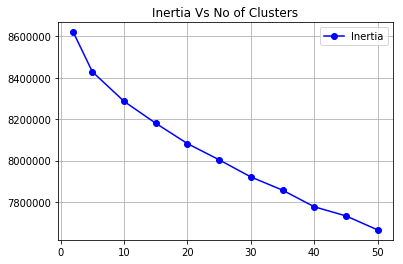

In [0]:
best_hype=find_best_hype(std_train_data)

### Plot word Cloud

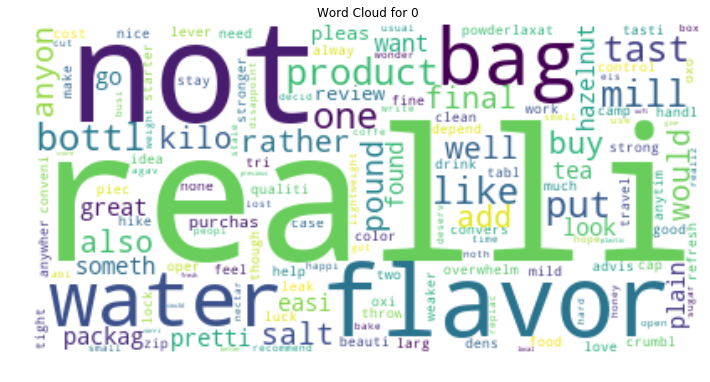

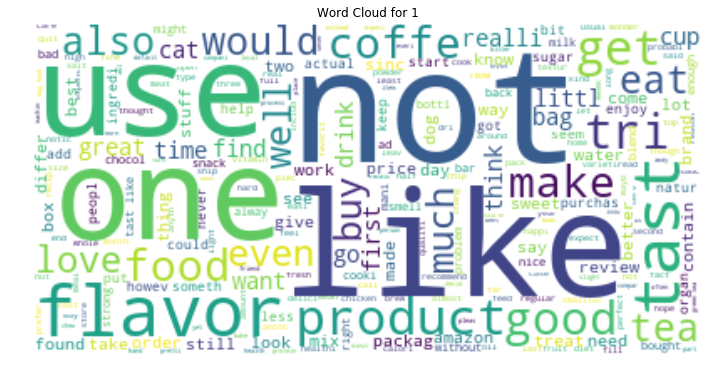

In [0]:
get_clusters(std_test_data,x_test,best_hype,'kmeans')

## 2.TFIDF

In [0]:
tfidf_count= TfidfVectorizer(min_df=10,max_features=300,ngram_range=(1,2))
tfidf_tr=tfidf_count.fit_transform(x_tr)
tfidf_test=tfidf_count.transform(x_test)
print("Shape of tfidf vector representation of train review text :",tfidf_tr.shape)
print("Shape of tfidf vector representation of test review text  :",tfidf_test.shape)

Shape of tfidf vector representation of train review text : (29445, 300)
Shape of tfidf vector representation of test review text  : (7362, 300)


In [0]:
# converting sparse matrix to dense matrix before doing standardization 
tfidf_dense_train_reviews=tfidf_tr.toarray()
tfidf_dense_test_reviews=tfidf_test.toarray()

# Apply standardization on train,test and cv dataset
std_data=StandardScaler()

std_train_data=std_data.fit_transform(tfidf_dense_train_reviews*1.0)
std_test_data=std_data.transform(tfidf_dense_test_reviews*1.0)


### Finding Best K

Best K :  35


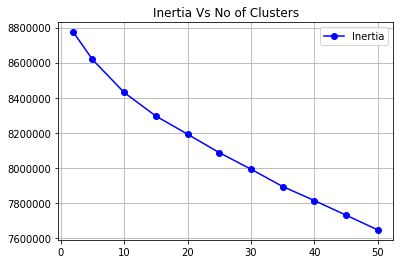

In [0]:
best_hype=find_best_hype(std_train_data)

### Plot word Cloud

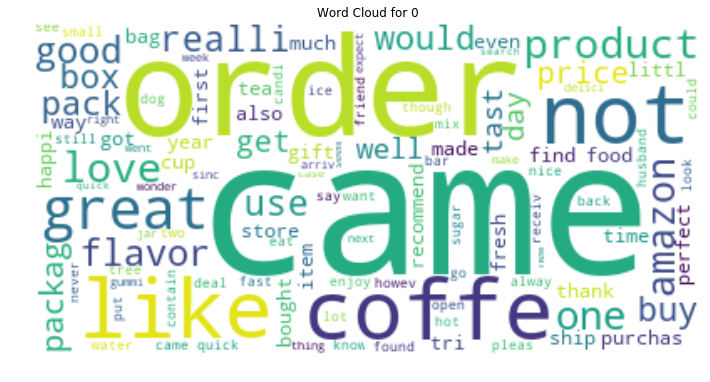

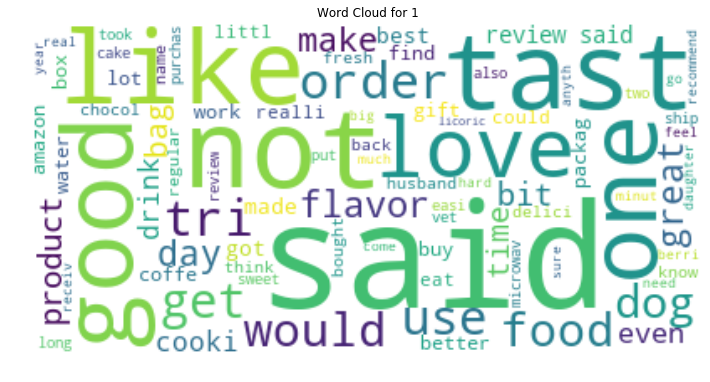

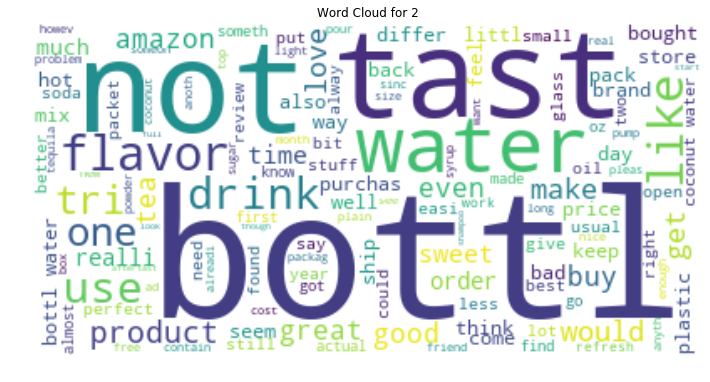

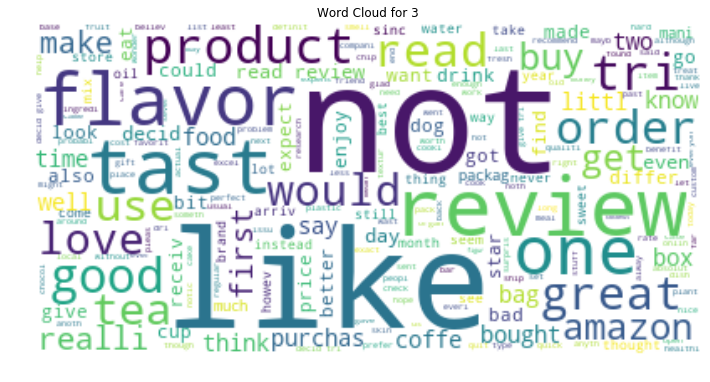

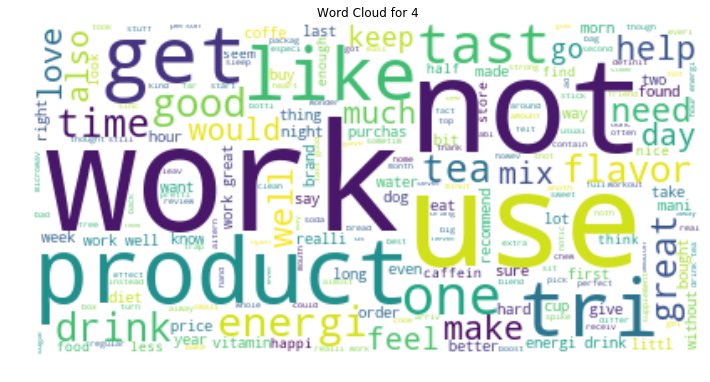

...

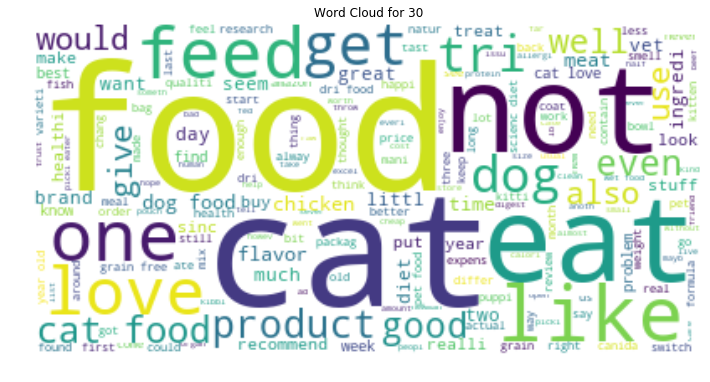

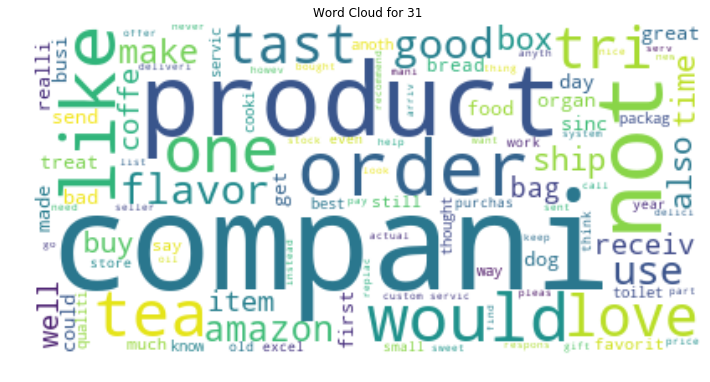

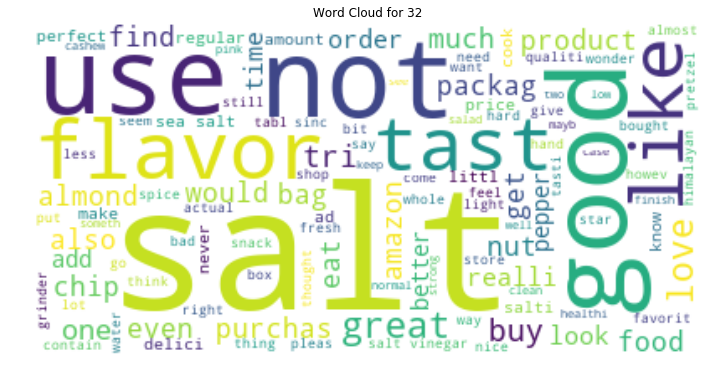

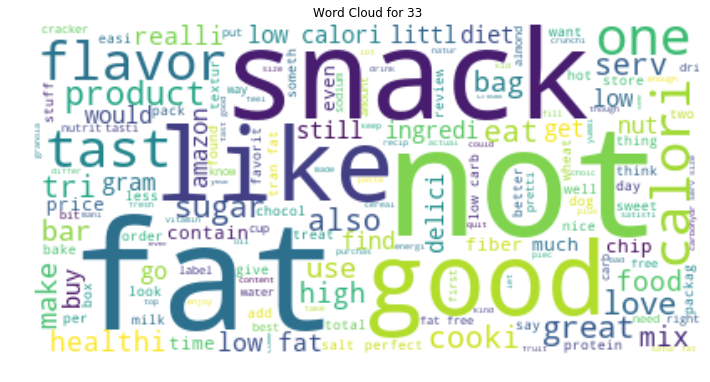

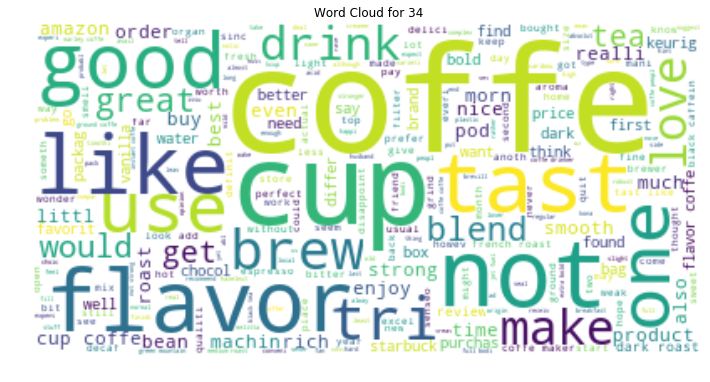

In [0]:
get_clusters(std_test_data,x_test,best_hype,'kmeans')

## 3. Avg Word2Vec

In [0]:
# As w2vec preserves semantic meaning of words I am not going to do stemming for this.
# split each sentence from train dataset into words
reviews=x_tr.copy()
train_sentences_set=[]
for s in reviews:
    train_sentences_set.append(s.split())
# min_count = 10 considers only words that occured atleast 10 times
# size = dimensionality of word vectors
# workers = no of threads to use while training our w2v model/featurization
w2v_model=Word2Vec(train_sentences_set,min_count=10,size=300, workers=4)
w2v_words= list(w2v_model.wv.vocab)

In [0]:
def compute_avgW2Vec(reviews):
    # average Word2Vec
    # compute average word2vec for each review.
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(rev_words): # for each review/sentence
        sent_vec = np.zeros(300) # as our w2v model is trained with size=50 i.e 50 dimension so this value will be change as dim change
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)

    return sent_vectors #Average W2v repersentation of reviews in given dataset


In [0]:
train_avgw2v=compute_avgW2Vec(x_tr) 

100%|██████████| 29445/29445 [00:28<00:00, 1031.64it/s]


In [0]:
test_avgw2v=compute_avgW2Vec(x_test) 

100%|██████████| 7362/7362 [00:07<00:00, 1002.98it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_avgw2v)
std_test_data=std_data.transform(test_avgw2v)

### Finding Best K

Best K :  2


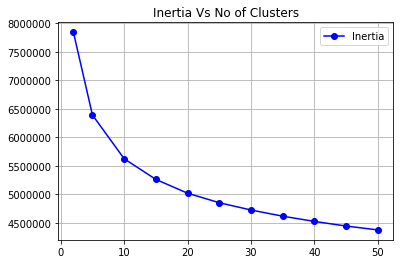

In [0]:
best_hype=find_best_hype(std_train_data)

### Plot word Cloud

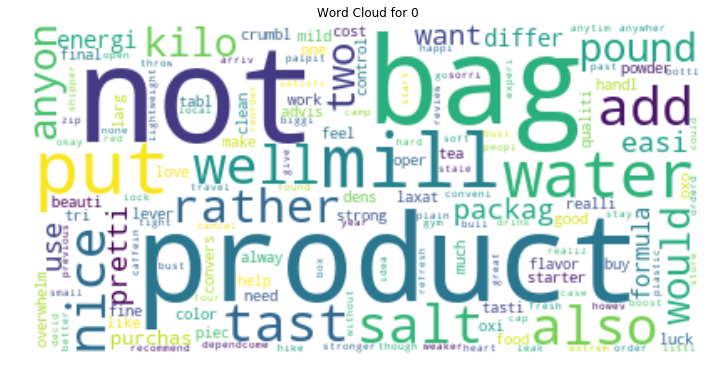

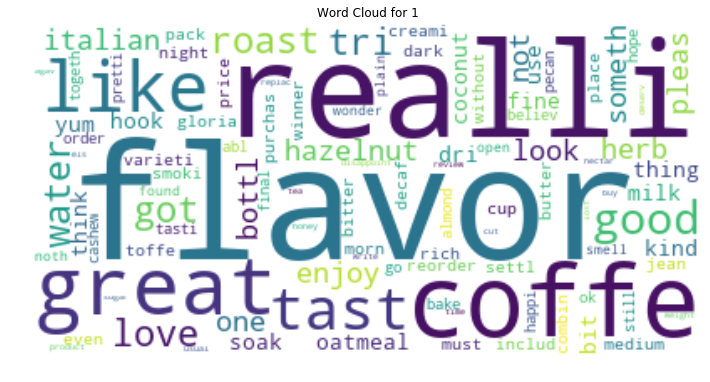

In [0]:
get_clusters(std_test_data,x_test,best_hype,'kmeans')

## 4. TFIDF weighted W2Vec

In [0]:
tfidf_w2v = TfidfVectorizer(min_df=10,max_features=300)
tfidf_w2v.fit(x_tr)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_w2v.get_feature_names(), list(tfidf_w2v.idf_)))
tfidf_feat = tfidf_w2v.get_feature_names() # tfidf words/col-names

In [0]:
def compute_tfidf_w2vec(reviews):
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    for sent in tqdm(rev_words): # for each review/sentence 
        sent_vec = np.zeros(300) #as our w2v model is trained with size=50 i.e 500 dimension so this value will be change as dim change
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf values of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1

    return tfidf_sent_vectors


In [0]:
train_tfidf_w2v=compute_tfidf_w2vec(x_tr) 

100%|██████████| 29445/29445 [00:38<00:00, 763.43it/s]


In [0]:

test_tfidf_w2v=compute_tfidf_w2vec(x_test) 

100%|██████████| 7362/7362 [00:09<00:00, 741.76it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_tfidf_w2v)
std_test_data=std_data.transform(test_tfidf_w2v)

### Finding Best K

Best K :  2


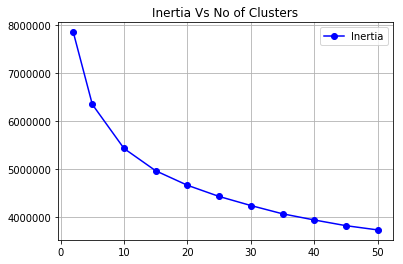

In [0]:
best_hype=find_best_hype(std_train_data)

### Plot word Cloud

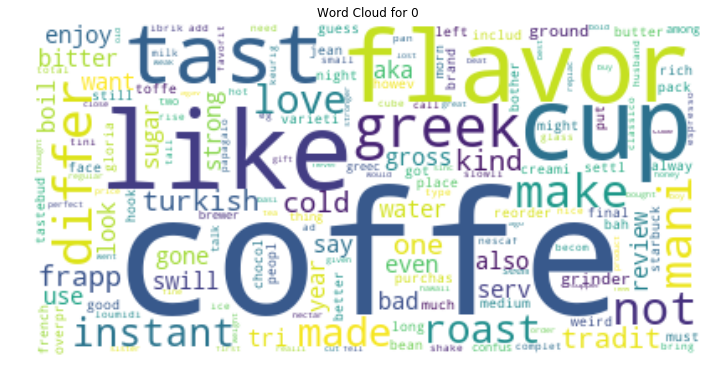

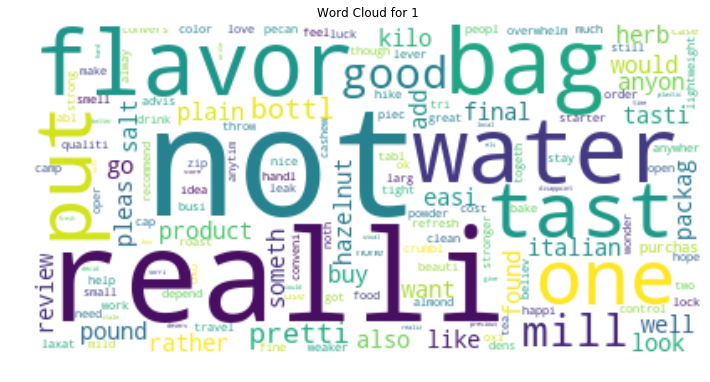

In [0]:
get_clusters(std_test_data,x_test,best_hype,'kmeans')

#  Agglomerative Clustering

In [0]:
final=filtered_data.sample(frac=0.015,random_state=2)
final.shape

(7887, 10)

In [0]:
print("Positive Reviews: ",final[final.Score ==1].shape[0])
print("Positive Reviews: ",final[final.Score ==-1].shape[0])

Positive Reviews:  6626
Positive Reviews:  1261


## Text Preprocessing 

In [0]:
def preprocess_my_data(data):
    return remove_unwanted_char(data)

In [0]:
data_to_be_processed=final['Text'].values
processed_data=preprocess_my_data(data_to_be_processed)
label=final['Score']
print(len(processed_data))


final['CleanedText']=processed_data
print(processed_data[0])

100%|██████████| 7887/7887 [00:03<00:00, 2524.07it/s]


7887
tried several times get good coconut flavored coffee little success boyer trick great coffee good amount coconut flavor highly recommend


## Stemming

In [0]:
stemmed_reviews=do_stemming(processed_data)

100%|██████████| 7887/7887 [00:07<00:00, 1033.33it/s]


## Splitting Data In Train ,CV and Test Dataset

In [0]:
# To avoid data leakage we are splitting our dataset before any featurization.
x_tr, x_test, y_tr, y_test = train_test_split(stemmed_reviews, label, test_size=0.2, random_state=0)

print("Sizes of Train,test dataset after split: {0} , {1}".format(len(x_tr),len(x_test)))

Sizes of Train,test dataset after split: 6309 , 1578


## 1. Avg Word2Vec

In [0]:
# As w2vec preserves semantic meaning of words I am not going to do stemming for this.
# split each sentence from train dataset into words
reviews=x_tr.copy()
train_sentences_set=[]
for s in reviews:
    train_sentences_set.append(s.split())
# min_count = 10 considers only words that occured atleast 10 times
# size = dimensionality of word vectors
# workers = no of threads to use while training our w2v model/featurization
w2v_model=Word2Vec(train_sentences_set,min_count=10,size=300, workers=4)
w2v_words= list(w2v_model.wv.vocab)

In [0]:
def compute_avgW2Vec(reviews):
    # average Word2Vec
    # compute average word2vec for each review.
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(rev_words): # for each review/sentence
        sent_vec = np.zeros(300) # as our w2v model is trained with size=50 i.e 50 dimension so this value will be change as dim change
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)

    return sent_vectors #Average W2v repersentation of reviews in given dataset


In [31]:
train_avgw2v=compute_avgW2Vec(x_tr) 

100%|██████████| 29445/29445 [00:28<00:00, 1041.62it/s]


In [32]:
test_avgw2v=compute_avgW2Vec(x_test) 

100%|██████████| 7362/7362 [00:07<00:00, 1012.51it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_avgw2v)
std_test_data=std_data.transform(test_avgw2v)

### Finding Best K 

Best K :  2


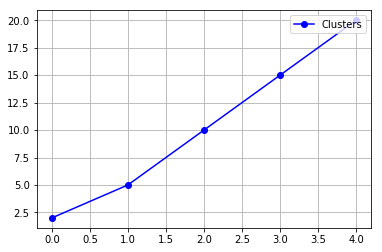

In [0]:
best_hype=find_best_K(std_train_data)

### Plot word Cloud

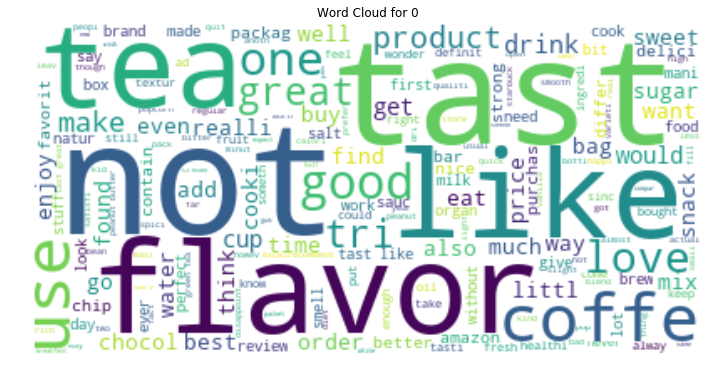

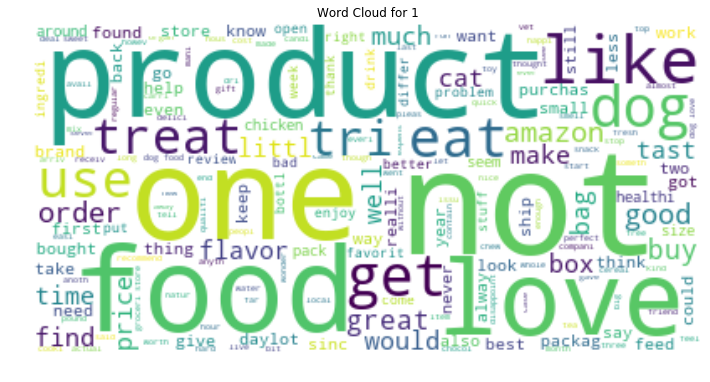

In [0]:
get_clusters(std_test_data,x_test,best_hype,'agg')

## 2. TFIDF weighted W2Vec

In [0]:
tfidf_w2v = TfidfVectorizer(min_df=10,max_features=300)
tfidf_w2v.fit(x_tr)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_w2v.get_feature_names(), list(tfidf_w2v.idf_)))
tfidf_feat = tfidf_w2v.get_feature_names() # tfidf words/col-names

In [0]:
def compute_tfidf_w2vec(reviews):
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    for sent in tqdm(rev_words): # for each review/sentence 
        sent_vec = np.zeros(300) #as our w2v model is trained with size=50 i.e 500 dimension so this value will be change as dim change
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf values of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1

    return tfidf_sent_vectors


In [0]:
train_tfidf_w2v=compute_tfidf_w2vec(x_tr) 

100%|██████████| 6309/6309 [00:06<00:00, 965.08it/s]


In [0]:

test_tfidf_w2v=compute_tfidf_w2vec(x_test) 

100%|██████████| 1578/1578 [00:01<00:00, 976.55it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_tfidf_w2v)
std_test_data=std_data.transform(test_tfidf_w2v)

### Finding Best K

Best K :  2


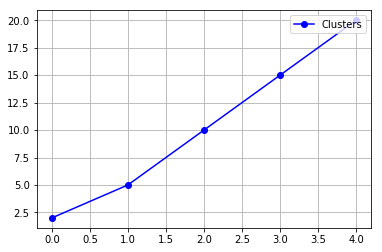

In [0]:
best_hype=find_best_K(std_train_data)

### Plot word Cloud

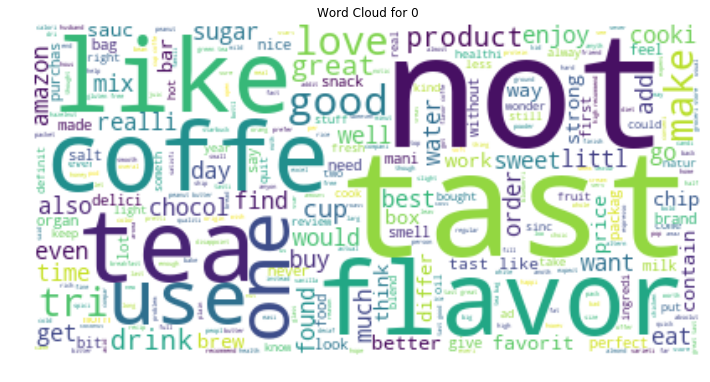

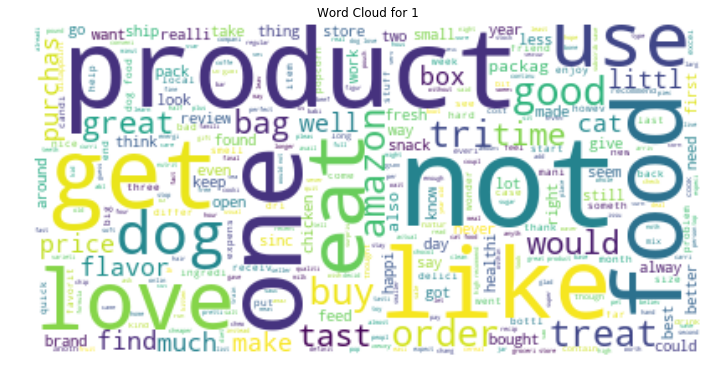

In [0]:
get_clusters(std_test_data,x_test,best_hype,'agg')

# DBSCAN Clustering

In [73]:
final=filtered_data.sample(frac=0.015,random_state=455)
final.shape

(7887, 10)

In [74]:
print("Positive Reviews: ",final[final.Score ==1].shape[0])
print("Positive Reviews: ",final[final.Score ==-1].shape[0])

Positive Reviews:  6667
Positive Reviews:  1220


## Text Preprocessing 

In [0]:
def preprocess_my_data(data):
    return remove_unwanted_char(data)

In [76]:
data_to_be_processed=final['Text'].values
processed_data=preprocess_my_data(data_to_be_processed)
label=final['Score']
print(len(processed_data))


final['CleanedText']=processed_data
print(processed_data[0])

100%|██████████| 7887/7887 [00:03<00:00, 2412.60it/s]

7887
best thing ordered line quality espresso blend not bitter strong coffee perfect espresso grind italian espresso machine keep buying beats locally ground espresso coffee buy run


## Stemming

In [77]:
stemmed_reviews=do_stemming(processed_data)

100%|██████████| 7887/7887 [00:07<00:00, 1028.31it/s]


## Splitting Data In Train ,CV and Test Dataset

In [78]:
# To avoid data leakage we are splitting our dataset before any featurization.
x_tr, x_test, y_tr, y_test = train_test_split(stemmed_reviews, label, test_size=0.2, random_state=0)

print("Sizes of Train,test dataset after split: {0} , {1}".format(len(x_tr),len(x_test)))

Sizes of Train,test dataset after split: 6309 , 1578


## 1. Avg Word2Vec

In [0]:
# As w2vec preserves semantic meaning of words I am not going to do stemming for this.
# split each sentence from train dataset into words
reviews=x_tr.copy()
train_sentences_set=[]
for s in reviews:
    train_sentences_set.append(s.split())
# min_count = 10 considers only words that occured atleast 10 times
# size = dimensionality of word vectors
# workers = no of threads to use while training our w2v model/featurization
w2v_model=Word2Vec(train_sentences_set,min_count=10,size=300, workers=4)
w2v_words= list(w2v_model.wv.vocab)

In [0]:
def compute_avgW2Vec(reviews):
    # average Word2Vec
    # compute average word2vec for each review.
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(rev_words): # for each review/sentence
        sent_vec = np.zeros(300) # as our w2v model is trained with size=50 i.e 50 dimension so this value will be change as dim change
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec)

    return sent_vectors #Average W2v repersentation of reviews in given dataset


In [81]:
train_avgw2v=compute_avgW2Vec(x_tr) 

100%|██████████| 6309/6309 [00:04<00:00, 1524.85it/s]


In [82]:
test_avgw2v=compute_avgW2Vec(x_test) 

100%|██████████| 1578/1578 [00:00<00:00, 1617.44it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_avgw2v)
std_test_data=std_data.transform(test_avgw2v)

### Finding Best K 

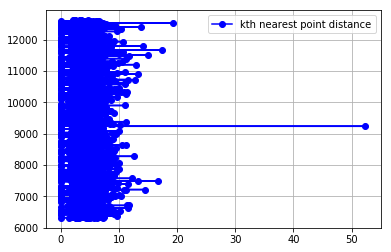

In [84]:
find_best_eps(std_train_data)

Here we can see most of the points having kth nearest neighbors in the proximity of 10 units.
Hence eps=10

### Plot word Cloud

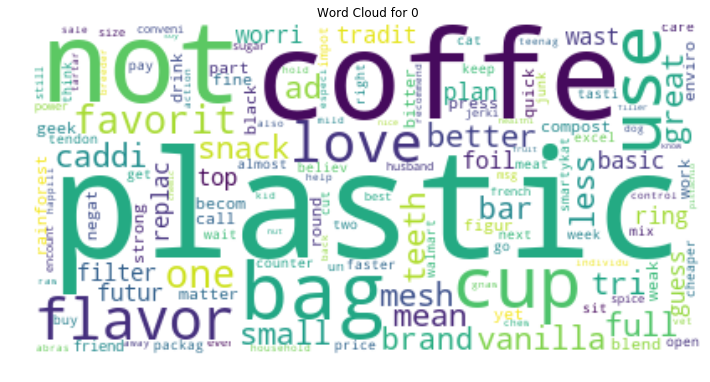

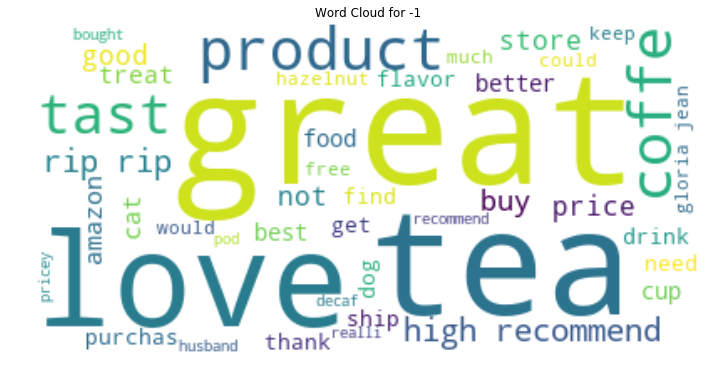

In [85]:
get_clusters(std_test_data,x_test,10,'dbscan')

## 2. TFIDF weighted W2Vec

In [0]:
tfidf_w2v = TfidfVectorizer(min_df=10,max_features=300)
tfidf_w2v.fit(x_tr)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_w2v.get_feature_names(), list(tfidf_w2v.idf_)))
tfidf_feat = tfidf_w2v.get_feature_names() # tfidf words/col-names

In [0]:
def compute_tfidf_w2vec(reviews):
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0
    rev_words=[]
    for i in reviews:
        rev_words.append(i.split())

    for sent in tqdm(rev_words): # for each review/sentence 
        sent_vec = np.zeros(300) #as our w2v model is trained with size=50 i.e 500 dimension so this value will be change as dim change
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf values of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1

    return tfidf_sent_vectors


In [88]:
train_tfidf_w2v=compute_tfidf_w2vec(x_tr) 

100%|██████████| 6309/6309 [00:05<00:00, 1051.79it/s]


In [89]:

test_tfidf_w2v=compute_tfidf_w2vec(x_test) 

100%|██████████| 1578/1578 [00:01<00:00, 1097.76it/s]


In [0]:
# Apply standardization on train,test and cv dataset
std_data=StandardScaler()
std_train_data=std_data.fit_transform(train_tfidf_w2v)
std_test_data=std_data.transform(test_tfidf_w2v)

### Finding Best K

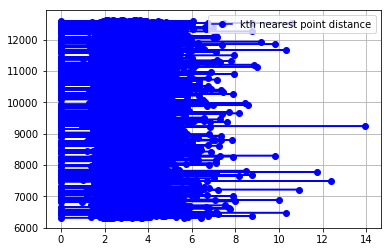

In [91]:
find_best_eps(std_train_data)

Here we can see most of the points having kth nearest neighbors in the proximity of 7 units.
Hence eps=7

### Plot word Cloud

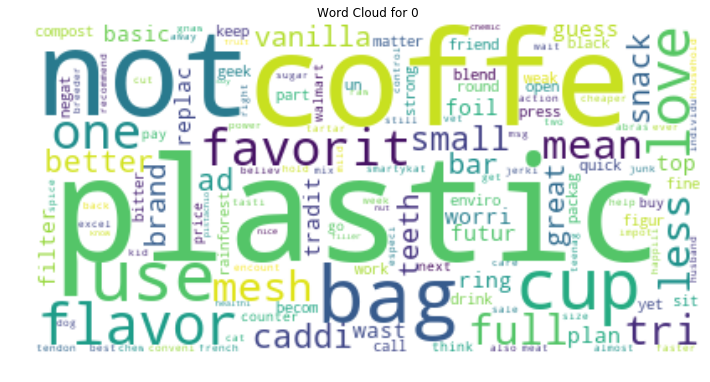

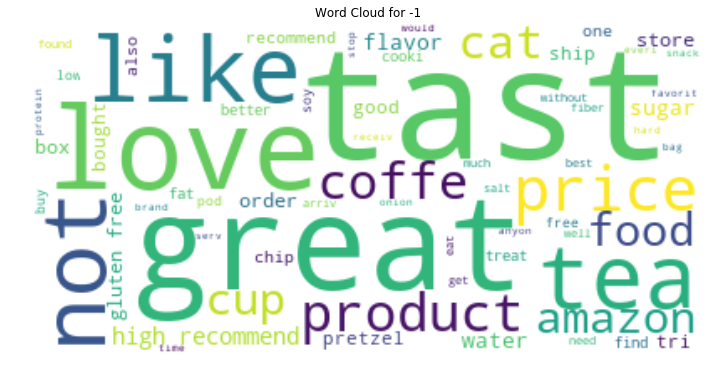

In [92]:
get_clusters(std_test_data,x_test,7,'dbscan')

# Summary

In [98]:
print("""
+++++++++++++++++++++++++++++++++++ K Means Clustering +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                |     Vectorizer     |    HyperParameter(k)        | 
                ___________________________________________________|
                        BoW          |       2                     |
                        tfidf        |      35                     |
                      Avg tfidf      |       2                     |
                tfidf Weighted W2v   |       2                     |    
 
 Cluster with label 1 have reviews for hazelnuts(and its varieties like whether they are roasted),coffee,oatmeals,italian food,toffe etc
                
+++++++++++++++++++++++++++++++++++ Agglomerative Clustering +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

                |    Vectorizer      |    HyperParameter(k)        | 
                ___________________________________________________|
                      Avg tfidf      |       2                     |
                tfidf Weighted W2v   |       2                     | 
                
1. Cluster with label 0, have reviews for products like coffee,tea,milk,snacks and their different flavors,taste
2. Cluster with label 1, have reviews regarding animal foods as there are frequent words such as dog,cat,chicken etc and overall positive reviews for
   products

+++++++++++++++++++++++++++++++++++ DBSCAN Clustering +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
​
                |    Vectorizer      |    HyperParameter(eps)      | 
                ___________________________________________________|
                      Avg tfidf      |       10                    |
                tfidf Weighted W2v   |       7                     |
                
1. Here word cloud with label -1 represent the noisy datapoints
2. Word Cloud with label 0 have many words related to coffee,ice-cream(vanila) and about product packaging (foil,plastic,bag etc words occured many times)                       
                """)            


+++++++++++++++++++++++++++++++++++ K Means Clustering +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
                |     Vectorizer     |    HyperParameter(k)        | 
                ___________________________________________________|
                        BoW          |       2                     |
                        tfidf        |      35                     |
                      Avg tfidf      |       2                     |
                tfidf Weighted W2v   |       2                     |    
 
 Cluster with label 1 have reviews for hazelnuts(and its varieties like whether they are roasted),coffee,oatmeals,italian food,toffe etc
                
+++++++++++++++++++++++++++++++++++ Agglomerative Clustering +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

                |    Vectorizer      |    HyperParameter(k)        | 
                ___________________________________________________|
                      Avg tfidf      |       2  

# Conclusion



1. In case of  Unsupervised learning train dataset is labelled but not test dataset

2. Basic idea behind clustering is Intra cluster distance should be as less as possible and inter cluster distance must be as much as possible.

3. There are 3 Clustering Techniques:
    *   K-Means Algorithm-
                It is centroid based clustering Technique.
                We need to provide K i.e no of clusters as hyperparameter.
                Lloyd's Algorithm is used to find best k.
    
    *  Hierarchical Clustering-
                Can be achieved in 2 ways:
                  1. Agglomerative Clustering-
                         Consider each point as cluster initially and then  incremently keep clustering each individual clusters based on proximity/distance between two points/clusters
                         
                  2. Divisive Clustering-
                          Consider everything as one big cluster and then keep  breaking each cluster until we get each point as individual cluster.

    *  DBSCAN(Density Based Spatial Clustering Application with Noise)-
                          It is technique to seperate dense clusters with noise; this clusters and noise points decided using eps and minpoints which are nothing but hyperparameters for DBSCAN.
